In [1]:
from google.colab import files
uploaded = files.upload()

Saving Leads Report 2021 Numeric Data.csv to Leads Report 2021 Numeric Data.csv


In [2]:
from google.colab import files
uploaded = files.upload()

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.decomposition import PCA # dimensionality reduction
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [4]:
# Load the dataset
data = pd.read_csv("/content/Leads Report 2021 Numeric Data.csv")

In [5]:
print(data.shape)
print(data.head())
print(data.dtypes)

(31, 23)
  State wise scores of individual parameters  Quality of Road Infrastructure  \
0                                    Gujarat                            3.85   
1                                    Haryana                            3.68   
2                                     Punjab                            3.88   
3                                  TamilNadu                            3.68   
4                                Maharashtra                            3.40   

   Quality of Rail Infrastructure  \
0                            3.62   
1                            3.67   
2                            3.91   
3                            3.30   
4                            3.45   

   Quality of Multi-Modal Terminal Infrastructure  \
0                                            3.79   
1                                            3.78   
2                                            3.98   
3                                            3.49   
4                     

In [6]:
! pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 12.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=32d860f7a3cfb7e126917dc48d4889f26876ba313c9502ec3d2d679db8e1653f
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [7]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     / 17.8 MB 24.4 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357942 sha256=7709f2846109199522d1086851e71645865f937b6f315478b37c79611add1d93
  Stored in directory: /tmp/pip-ephem-wheel-cache-b90qgqbe/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
Successfully built ydata-profiling
  Attempting uninstall: ydata-profiling
    Found existing installation: ydata-profiling 4.7.0
    Uninstalling ydata-profiling-4.7.0:
      Successfully uninstalled ydata-profiling-4.7.0


In [8]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport

In [9]:
from pandas_profiling import ProfileReport
ProfileReport= ProfileReport(data , title ='pandas profiling report')
ProfileReport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

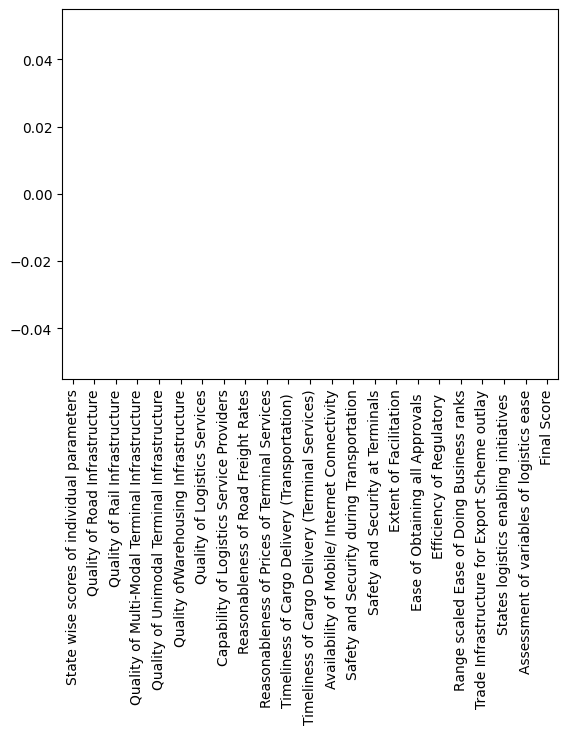

In [ ]:
#Checking null values
data.isna().sum().plot(kind='bar')

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Quality of Road Infrastructure,31.0,3.041613,0.603374,1.93,2.550,3.07,3.495,3.88
Quality of Rail Infrastructure,31.0,2.881935,0.661521,1.50,2.295,3.02,3.355,3.91
Quality of Multi-Modal Terminal Infrastructure,31.0,2.917742,0.677828,1.53,2.420,3.13,3.430,3.98
Quality of Unimodal Terminal Infrastructure,31.0,2.822258,0.479678,1.94,2.500,2.92,3.185,3.63
Quality ofWarehousing Infrastructure,31.0,2.917742,0.542714,1.92,2.455,2.90,3.360,3.74
Quality of Logistics Services,31.0,3.041613,0.622613,1.87,2.640,3.23,3.530,3.89
Capability of Logistics Service Providers,31.0,3.105161,0.594849,1.78,2.705,3.38,3.515,3.87
Reasonableness of Road Freight Rates,31.0,2.156452,0.446964,1.27,1.830,2.25,2.495,2.78
Reasonableness of Prices of Terminal Services,31.0,2.239677,0.403745,1.43,1.930,2.35,2.580,2.75
Timeliness of Cargo Delivery (Transportation),31.0,3.016129,0.567678,1.87,2.650,3.18,3.480,3.70


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31 entries, 0 to 30
Data columns (total 23 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   State wise scores of individual parameters        31 non-null     object 
 1   Quality of Road Infrastructure                    31 non-null     float64
 2   Quality of Rail Infrastructure                    31 non-null     float64
 3   Quality of Multi-Modal Terminal Infrastructure    31 non-null     float64
 4   Quality of Unimodal Terminal Infrastructure       31 non-null     float64
 5   Quality ofWarehousing Infrastructure              31 non-null     float64
 6   Quality of Logistics Services                     31 non-null     float64
 7   Capability of Logistics Service Providers         31 non-null     float64
 8   Reasonableness of Road Freight Rates              31 non-null     float64
 9   Reasonableness of Price

In [ ]:
data['Final Score']

0     3.66
1     3.52
2     3.51
3     3.36
4     3.32
5     3.25
6     3.20
7     3.18
8     3.17
9     3.14
10    3.09
11    3.09
12    3.06
13    3.06
14    3.04
15    2.96
16    2.90
17    2.84
18    2.77
19    2.75
20    2.63
21    2.64
22    2.63
23    2.51
24    2.50
25    2.43
26    2.39
27    2.12
28    2.02
29    3.35
30    3.06
Name: Final Score, dtype: float64

In [12]:
data['Final Score'].value_counts()

Final Score
3.06    3
2.63    2
3.09    2
3.66    1
2.84    1
2.02    1
2.12    1
2.39    1
2.43    1
2.50    1
2.51    1
2.64    1
2.75    1
2.77    1
2.96    1
2.90    1
3.52    1
3.04    1
3.14    1
3.17    1
3.18    1
3.20    1
3.25    1
3.32    1
3.36    1
3.51    1
3.35    1
Name: count, dtype: int64

[ 8  9 22 25 16 28 21 13  0 26  5 12 29 14 30 23 15  7  3 10  2 11 24 18
 27  1 17 19 20  6  4]
    Quality of Road Infrastructure  Quality of Rail Infrastructure  \
0                             3.85                            3.62   
1                             3.68                            3.67   
2                             3.88                            3.91   
3                             3.68                            3.30   
4                             3.40                            3.45   
5                             3.47                            3.50   
6                             3.28                            2.97   
7                             3.51                            3.33   
8                             3.59                            3.26   
9                             3.48                            3.14   
10                            3.31                            3.31   
11                            2.88                            3.

<Axes: >

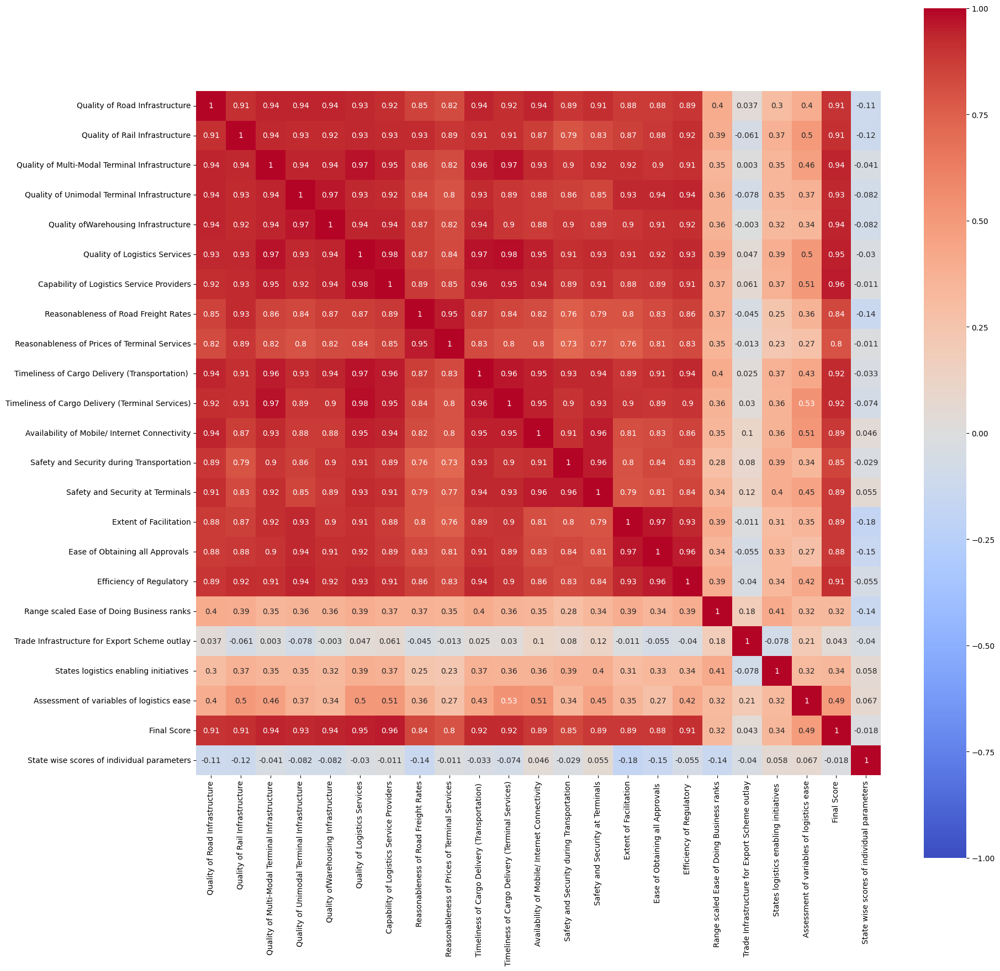

In [17]:
from sklearn.preprocessing import LabelEncoder

# Creating a instance of label Encoder.
le = LabelEncoder()

# Using .fit_transform function to fit label
# encoder and return encoded label
label = le.fit_transform(data['State wise scores of individual parameters'])

# printing label
print(label)
data.drop("State wise scores of individual parameters", axis=1, inplace=True)

# Appending the array to our dataFrame
# with column name 'Purchased'
data["State wise scores of individual parameters"] = label

# printing Dataframe
print(data)
plt.figure(figsize=(20,20))
sns.heatmap(data.corr('pearson'),vmin=-1,vmax=1,cmap='coolwarm',square=True,annot=True)

In [18]:
df=data
df_corr = pd.DataFrame(data.corr().unstack().sort_values(ascending=False)['Final Score'],columns=['correlation to the target'])
df_corr.style.background_gradient(cmap=sns.light_palette('green',as_cmap=True))

,correlation to the target
Final Score,1.000000
Capability of Logistics Service Providers,0.955563
Quality of Logistics Services,0.952009
Quality ofWarehousing Infrastructure,0.943528
Quality of Multi-Modal Terminal Infrastructure,0.941291
Quality of Unimodal Terminal Infrastructure,0.929783
Timeliness of Cargo Delivery (Terminal Services),0.924051
Timeliness of Cargo Delivery (Transportation),0.923715
Quality of Rail Infrastructure,0.913035
Efficiency of Regulatory,0.911096


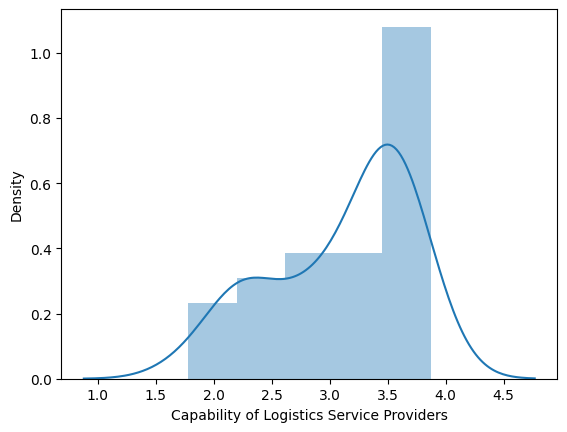

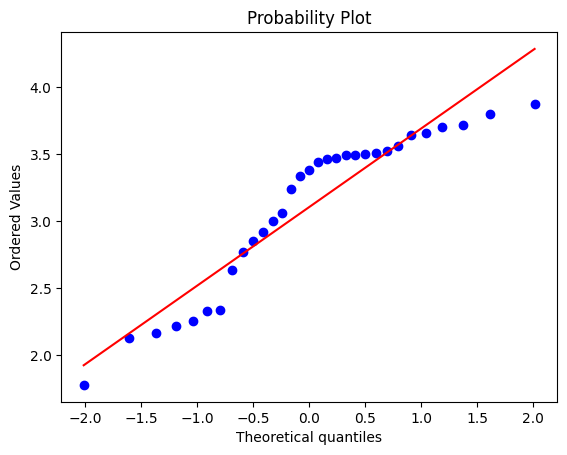

In [19]:
sns.distplot(data['Capability of Logistics Service Providers'])
fig = plt.figure()
res = stats.probplot(data['Capability of Logistics Service Providers'], plot=plt)


In [20]:
data_score=data['Final Score']
data=data.drop(['Final Score'],axis=1)

<Axes: xlabel='Final Score', ylabel='Quality of Logistics Services'>

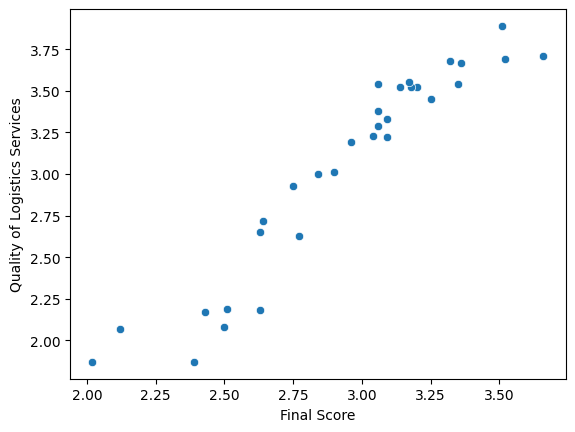

In [21]:
sns.scatterplot(x=data_score,y=data['Quality of Logistics Services'])

<Axes: xlabel='Final Score', ylabel='Ease of Obtaining all Approvals '>

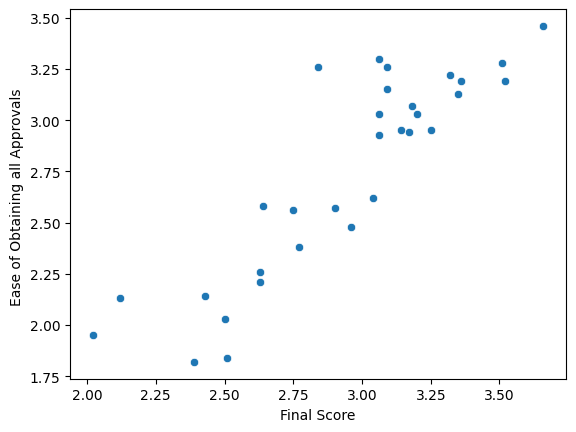

In [22]:
sns.scatterplot(x=data_score,y=data['Ease of Obtaining all Approvals '])

In [23]:
#ppling PCA
pca = PCA(n_components=10)
principalComponents = pca.fit_transform(data)
principalDf = pd.DataFrame(data = principalComponents , columns = ['PCA1', 'PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA78','PCA9','PCA10'],index=data.index)

In [24]:
principalDf

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA78,PCA9,PCA10
0,7.006925,-2.232304,-1.654852,-0.914560,1.289326,0.242436,0.046751,-0.377722,-0.244331,0.177868
1,6.060081,-1.603661,-1.741637,1.033987,-2.258528,-0.365697,-0.201872,-0.117939,-0.104873,-0.166409
2,-6.943530,-2.896217,-1.388789,0.167839,-0.970137,-0.445162,-0.032158,0.011123,-0.255074,0.037002
3,-9.950064,-1.579336,0.356250,3.704372,0.201053,0.170794,0.206130,-0.109869,-0.097396,-0.137410
4,-0.989060,-1.631109,-0.943723,0.256847,0.815828,0.107139,0.030335,-0.362610,-0.129800,-0.050838
5,-12.930068,-3.182376,1.027545,-1.850244,-0.605357,-0.426984,0.213791,-0.161302,-0.126093,0.035913
6,-6.017846,-0.044701,-2.140107,0.737687,-0.538767,-0.745321,-0.246504,-0.353985,0.365501,0.328783
7,2.021475,-2.167590,-0.035102,-0.593491,1.104588,0.144737,-0.044560,0.050802,-0.078993,-0.123569
8,15.088104,-2.031876,2.584728,2.029547,-0.116657,0.214675,-0.291248,0.249323,0.041540,0.099136
9,-10.936626,-3.099711,0.964737,-1.816509,-0.489507,0.393789,-0.666673,0.240620,0.236734,0.106041


In [25]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(principalDf)
principalDf['PCA_SCORE'] = kmeans.predict(principalDf)

In [26]:
print(principalDf['PCA_SCORE'][:10])


0    0
1    3
2    1
3    1
4    3
5    1
6    2
7    3
8    0
9    1
Name: PCA_SCORE, dtype: int32


In [27]:
principalDf.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA78,PCA9,PCA10,PCA_SCORE
0,7.006925,-2.232304,-1.654852,-0.914560,1.289326,0.242436,0.046751,-0.377722,-0.244331,0.177868,0
1,6.060081,-1.603661,-1.741637,1.033987,-2.258528,-0.365697,-0.201872,-0.117939,-0.104873,-0.166409,3
2,-6.943530,-2.896217,-1.388789,0.167839,-0.970137,-0.445162,-0.032158,0.011123,-0.255074,0.037002,1
3,-9.950064,-1.579336,0.356250,3.704372,0.201053,0.170794,0.206130,-0.109869,-0.097396,-0.137410,1
4,-0.989060,-1.631109,-0.943723,0.256847,0.815828,0.107139,0.030335,-0.362610,-0.129800,-0.050838,3


In [28]:
y_score=principalDf['PCA_SCORE']

In [29]:
print(y_score[1:10])

1    3
2    1
3    1
4    3
5    1
6    2
7    3
8    0
9    1
Name: PCA_SCORE, dtype: int32


In [30]:
print(data_score[1:10])

1    3.52
2    3.51
3    3.36
4    3.32
5    3.25
6    3.20
7    3.18
8    3.17
9    3.14
Name: Final Score, dtype: float64


In [31]:
#Calculating Mean Squared Error
MSEValue = mean_squared_error(y_score, data_score, multioutput='uniform_average') # it can be raw_values
print('Mean Squared Error Value is : ', MSEValue)

Mean Squared Error Value is :  3.904209677419355


In [32]:
#Calculating Median Absolute Error
MdSEValue = median_absolute_error(y_score, data_score)
print('Median Absolute Error Value is : ', MdSEValue )

Median Absolute Error Value is :  1.96


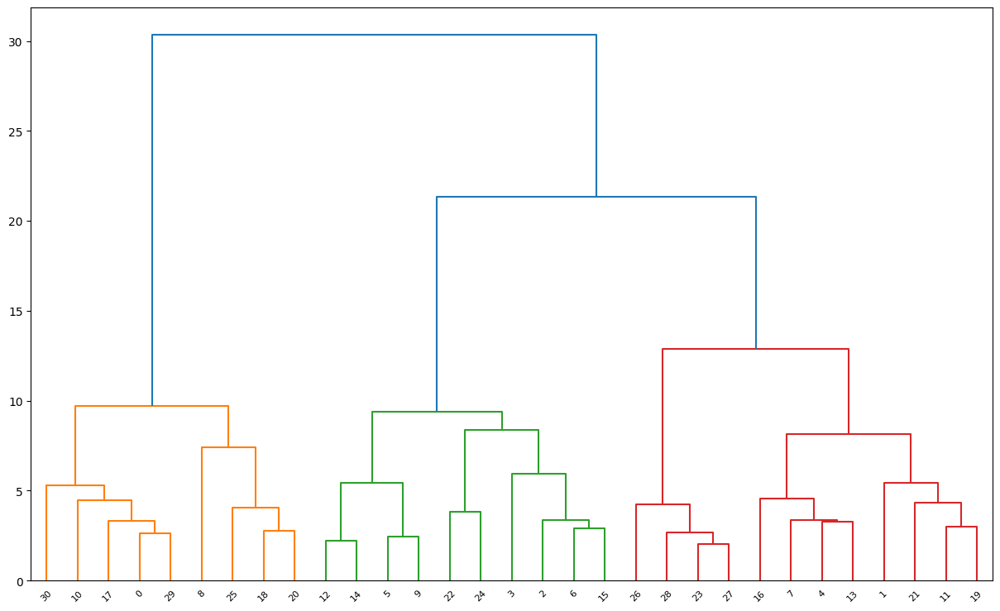

In [33]:
# create dendrogram
figure,ax = plt.subplots(1,1,figsize=(15,9))
dendrogram = sch.dendrogram(sch.linkage(data, method='complete'),labels=data.index,ax=ax)
# create clusters
hc = AgglomerativeClustering(n_clusters=4, affinity = 'euclidean', linkage = 'ward')
# save clusters for chart
y_hc = hc.fit_predict(data)

In [34]:
#Calculating Median Absolute Error
MdSEValue = median_absolute_error(y_hc, data_score)
print('Median Absolute Error Value is : ', MdSEValue )


Median Absolute Error Value is :  1.75


In [35]:
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(data, data_score, test_size=0.4, random_state=44, shuffle =True)

#Splitted Data
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (18, 22)
X_test shape is  (13, 22)
y_train shape is  (18,)
y_test shape is  (13,)


In [36]:
#Applying Ridge Regression Model

'''
sklearn.linear_model.Ridge(alpha=1.0, fit_intercept=True, normalize=False,
                           copy_X=True, max_iter=None, tol=0.001, solver='auto',
                           random_state=None)
'''
RidgeRegressionModel = Ridge(alpha=.2,random_state=33)
RidgeRegressionModel.fit(X_train, y_train)

#Calculating Details
print('Ridge Regression Train Score is : ' , RidgeRegressionModel.score(X_train, y_train))
print("##########################################################")

print('Ridge Regression Test Score is : ' , RidgeRegressionModel.score(X_test, y_test))
print("##########################################################")

print('Ridge Regression Coef is : ' , RidgeRegressionModel.coef_)
print("##########################################################")

print('Ridge Regression intercept is : ' , RidgeRegressionModel.intercept_)
print("##########################################################")

#print('----------------------------------------------------')

#Calculating Prediction
y_pred = RidgeRegressionModel.predict(X_test)
print("##########################################################")
print('Predicted Value for Ridge Regression is : ' , y_pred[:10])

Ridge Regression Train Score is :  0.9753162450187502
##########################################################
Ridge Regression Test Score is :  0.8233541589432383
##########################################################
Ridge Regression Coef is :  [ 0.16069651  0.09329772  0.24251451  0.0154643   0.16580117  0.05575144
  0.04874337  0.01455637 -0.06685345 -0.07994596  0.10057398 -0.14856635
 -0.16098572  0.12932616  0.05303827 -0.02123376 -0.02061609 -0.04709977
 -0.0021012   0.02619814  0.04225889  0.00487427]
##########################################################
Ridge Regression intercept is :  1.0175265092300314
##########################################################
##########################################################
Predicted Value for Ridge Regression is :  [2.6099194  2.86203806 3.54721755 2.5006298  2.45351068 2.85989047
 3.08030498 2.44951642 2.69064413 2.9957829 ]


In [38]:
'''
sklearn.linear_model.SGDRegressor(loss='squared_loss’, penalty=’l2’, alpha=0.0001,
                                  l1_ratio=0.15, fit_intercept=True, max_iter=None,
                                  tol=None, shuffle=True, verbose=0, epsilon=0.1,
                                  random_state=None, learning_rate='invscaling’,
                                  eta0=0.01, power_t=0.25, early_stopping=False,
                                  validation_fraction=0.1, n_iter_no_change=5,
                                  warm_start=False, average=False, n_iter=None)
'''

SGDRegressionModel = SGDRegressor(alpha=.004,random_state=33,penalty='l2',loss = 'huber')
SGDRegressionModel.fit(X_train, y_train)

#Calculating Details
print('SGD Regression Train Score is : ' , SGDRegressionModel.score(X_train, y_train))
print("##########################################################")

print('SGD Regression Test Score is : ' , SGDRegressionModel.score(X_test, y_test))
print("##########################################################")

print('SGD Regression Coef is : ' , SGDRegressionModel.coef_)
print("##########################################################")

print('SGD Regression intercept is : ' , SGDRegressionModel.intercept_)
print("##########################################################")

#print('----------------------------------------------------')

#Calculating Prediction
y_pred = SGDRegressionModel.predict(X_test)
print("##########################################################")

print('Predicted Value for SGD Regression is : ' , y_pred[:10])


SGD Regression Train Score is :  0.787235741894571
##########################################################
SGD Regression Test Score is :  0.7719135617959992
##########################################################
SGD Regression Coef is :  [0.05140244 0.04934113 0.04866965 0.04752483 0.04838538 0.04998518
 0.05229474 0.0348897  0.0362074  0.04752971 0.05184104 0.04975145
 0.0485325  0.05239303 0.04823407 0.04718585 0.04523137 0.01887734
 0.01747976 0.0523534  0.04984795 0.00646985]
##########################################################
SGD Regression intercept is :  [0.01746024]
##########################################################
##########################################################
Predicted Value for SGD Regression is :  [2.62821657 2.91952959 3.5203892  2.07884462 1.98033514 2.98690769
 3.13857324 2.24301931 2.83654227 3.16854471]
